# 黑特東華在黑特什麼? 網路、社會與文字探勘實務
- 講題：黑特東華在黑特什麼? 網路、社會與文字探勘實務
- 主講人：游騰林(國泰世華銀行 數據生態營運部 資料科學分析師)
- 時間：11月24日(四) 早上10:00 ~ 12:00
- 地點：人社二館 D105
- 詳細說明: <br>
  黑特東華(Hate NDHU) 粉絲專頁自 2014 年成立至今已經累積了超過 15,000 個讚與 11,000 篇貼文，在粉絲專頁中的貼文涵蓋了學生對於學校各個面向的抱怨。如能善用這些資料進行分析，我們將能從中找出許多有價值資訊並提供學校具體的管理建議。然而要分析這些資料將有兩個不易克服的難點，其一是這些貼文資料並未開放批次下載，我們並不易取得粉絲專頁上的貼文資料。其二是這些貼文屬於非結構化的文本資料，分析時需要採用自然語言處理(NLP)的分析技術才能從中萃取出有價值的資訊。在這次的演講中我除了會說明要如何克服上面提到的兩個難點之外，也會和你/妳分享我的分析發現，也期待你/妳能搭配社會學的視角一起幫忙處理就近自己身邊的大小事。

# Crawl data from facebook
- https://github.com/TLYu0419/facebook_crawler

# Import package

In [1]:
# !pip install jieba
# !pip install jiagu
# !pip install gensim
# !pip install sklearn

In [1]:
import re

import json

import jiagu
import jieba

import numpy as np
import pandas as pd

import datetime 

# from gensim.models import Word2Vec
# from gensim.models.doc2vec import Doc2Vec, TaggedDocument
# from gensim.models.callbacks import CallbackAny2Vec

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from udf_dict import udf_dict, stop_words, deps

from sentence_transformers import SentenceTransformer, util
# from ckip_transformers.nlp import CkipWordSegmenter, CkipPosTagger, CkipNerChunker

plt.rcParams['axes.unicode_minus'] = False

C:\Users\tlyu0419\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# UDF

In [2]:
def _extract_reactions(reactions, reaction_type):
    '''
    Extract reaction_type from reactions.
    Possible reaction_type's value will be one of ['LIKE', 'HAHA', 'WOW', 'LOVE', 'SUPPORT', 'SORRY', 'ANGER'] 
    '''
    for reaction in reactions:
        if reaction['node']['localized_name'].upper() == reaction_type.upper():
            return reaction['reaction_count']
    return 0

In [3]:
def plot_wordcloud(word_dict):
    wordcloud =  WordCloud(font_path='C:/Windows/Fonts/Microsoft YaHei/msyh.ttc',
                           width=1000,
                           height=700,
                           max_words=80,
                           min_font_size=3,
                           background_color="white")
    wordcloud = wordcloud.generate_from_frequencies(word_dict)
    plt.figure(figsize=(9, 6), dpi=160)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.grid(None)
    plt.axis("off")

# Load data

In [4]:
df1 = pd.read_pickle('../../Repositories/facebook_crawler/develop/data/20220924_hatendhu.pkl')
df2 = pd.read_pickle('../../Repositories/facebook_crawler/develop/data/20220925_hatendhu.pkl')
df3 = pd.read_pickle('../../Repositories/facebook_crawler/develop/data/20220926_hatendhu.pkl')
df4 = pd.read_pickle('../../Repositories/facebook_crawler/develop/data/20221009_hatendhu.pkl')
df5 = pd.read_pickle('../../Repositories/facebook_crawler/develop/data/20221027_hatendhu.pkl')

df = pd.concat([df1, df2, df3, df4, df5], ignore_index=True)
del df1, df2, df3, df4, df5

df = df.sort_values('UPDATETIME', ascending=False)
df = df.drop_duplicates('POSTID', ignore_index=True)
df = df.sort_values('TIME', ascending=True)
df = df.reset_index(drop=True)
print(df.shape)
df.head()

(11468, 17)


,NAME,PAGEID,POSTID,TIME,MESSAGE,ATTACHMENT_TITLE,ATTACHMENT_DESCRIPTION,ATTACHMENT_PHOTOS,REACTIONCOUNT,COMMENTCOUNT,DISPLAYCOMMENTCOUNT,SHARECOUNT,REACTIONS,CURSOR,ACTOR_URL,POST_URL,UPDATETIME
0,黑特東華 NDHU Hate,100064708507691,302679573270710,2014-11-11 18:51:05,None,,,,17,0,0,0,"[{'reaction_count': 17, 'node': {'id': '163585...",AQHRCgD9SpZOjNtn5vp5pqVyWQ7hDMTaKH1Tbbcc_3Nr2M...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/302679...,2022-10-28 00:54:11
1,黑特東華 NDHU Hate,100064708507691,302894876582513,2014-11-12 12:17:25,None,,,https://scontent.ftpe10-1.fna.fbcdn.net/v/t1.1...,3,0,0,0,"[{'reaction_count': 3, 'node': {'id': '1635855...",AQHRnrotlm9LeTJKF1ce2mFhxjWbWMIayr9jLjQmVHTKGR...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/302894...,2022-10-28 00:54:11
2,黑特東華 NDHU Hate,100064708507691,302949503243717,2014-11-12 18:00:50,【公告】\n小編尚未完成招募管理員，\n也不是原靠北東華的管理員\n小編我只是想要開放個空間...,,,,8,0,0,0,"[{'reaction_count': 8, 'node': {'id': '1635855...",AQHRsihclL2i-m1CxRQayZAEfZ_jTX4TZ4_tx_A0GeYA0q...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/pfbid0...,2022-10-28 00:54:11
3,黑特東華 NDHU Hate,100064708507691,306667499538584,2014-11-26 02:36:44,https://www.ptt.cc/bbs/Gossiping/M.1416938836....,Re: [爆卦] 超沒品的廣告 (下),看完這支廣告 就知道票一定要投給柯文哲,,22,2,2,0,"[{'reaction_count': 22, 'node': {'id': '163585...",AQHRSbhiR49ggH54QaVpE5J6mM_8tqzl8PVgQ6VVMdlRDd...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/306667...,2022-10-28 00:54:11
4,黑特東華 NDHU Hate,100064708507691,306958996176101,2014-11-27 02:28:15,今天深夜就到此為止，小編我該睡了...\n下次更新應該是今天中午吃飯吧\n各位也早點睡吧，小...,熬夜增泌乳素 30歲男不舉 | 蘋果日報,【蔡明樺╱台北報導】當慣夜貓族，恐成不舉男。一名三十歲壯男長期熬夜、常凌晨二時後才睡覺，一個...,,24,1,1,0,"[{'reaction_count': 24, 'node': {'id': '163585...",AQHRnEAwyBDE3K1RlHbtXoZ11dwHuxJZ5qZJkfsuyCHujc...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/306958...,2022-10-28 00:54:11


In [12]:
# df

In [24]:
df.to_excel('hatendhu_posts.xlsx', index=False)

In [5]:
df.columns

Index(['NAME', 'PAGEID', 'POSTID', 'TIME', 'MESSAGE', 'ATTACHMENT_TITLE',
       'ATTACHMENT_DESCRIPTION', 'ATTACHMENT_PHOTOS', 'REACTIONCOUNT',
       'COMMENTCOUNT', 'DISPLAYCOMMENTCOUNT', 'SHARECOUNT', 'REACTIONS',
       'CURSOR', 'ACTOR_URL', 'POST_URL', 'UPDATETIME'],
      dtype='object')

# EDA
- Why we need to do EDA? Because we have to introduce our data and convinced to the audinece.

In [6]:
ndf = df[['REACTIONS']].explode('REACTIONS')
print(ndf.shape)
ndf = ndf.loc[ndf['REACTIONS'].notnull()]
print(ndf.shape)
ndf['reaction_type'] = ndf['REACTIONS'].apply(lambda x: x['node']['localized_name'])
ndf['reaction_type'].value_counts()

(24086, 1)
(24077, 1)


Like        11459
Haha         3715
Wow          3122
Sad          1944
Love         1585
Care         1176
Angry        1047
Thankful       15
Pride          14
Name: reaction_type, dtype: int64

In [7]:
df['LIKE'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Like'))
df['HAHA'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Haha'))
df['WOW']  = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Wow'))
df['SAD']  = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Sad'))
df['LOVE'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Love'))
df['CARE'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Care'))

In [8]:
ndf = df[['POSTID', 'MESSAGE', 'LIKE', 'HAHA', 'WOW', 'SAD', 'LOVE', 'CARE', 'COMMENTCOUNT', 'SHARECOUNT']]
ndf = ndf.set_index(['POSTID', 'MESSAGE']).stack().reset_index()
ndf = ndf.rename({'level_2':'REACTION_TYPE', 0:'CNT'}, axis=1)
ndf = ndf.sort_values('CNT', ascending=False)
ndf = ndf.groupby(['REACTION_TYPE']).head(1)
ndf.sort_values(['REACTION_TYPE', 'CNT'],ascending = [True, False])

,POSTID,MESSAGE,REACTION_TYPE,CNT
85989,1810914805780505,#52089\n\n我真的每天都不開心了。\n\n從事情開始到現在，我一直都沒有公開在黑特上...,CARE,154
87158,1862359323969386,#52249\n\n徵 ‘’純‘’陪睡人員\n時薪：200元\n條件：不會打呼、不會磨牙、不...,COMMENTCOUNT,879
87249,1863745383830780,#52261\n\n行雲一莊217前任房主，你家的加藤惠忘記帶走了，請到行雲管理室認領,HAHA,260
20608,723195971219066,#21739\n\n請問東華除了鴿子\n還有誰在養羊嗎？\n在原民院的草皮上\n東華農場？\...,LIKE,1031
31172,886957661509562,#27518\n\n深夜在校園遇到一隻可愛的貓貓，希望不是走失的,LOVE,66
72003,1650577585147562,#49512\n\n關於大虎的事情，還是有些事情真的讓人無法忍住不說：\n 在昨...,SAD,448
91191,482969590536654,#52754\n\n法氓再次於東華大學版dcard征戰，\n口誅筆伐，劍鋒直指校長。,SHARECOUNT,112
67066,1539699272902061,#47527\n\n就在今天，我在管院外被十幾隻蜜蜂咬了！痛到我一直哭，手整個腫起來，也只能...,WOW,175


# Preprocessing

In [9]:
ndf = df[['NAME', 'POSTID', 'TIME', 'MESSAGE', 'ATTACHMENT_TITLE', 'ATTACHMENT_DESCRIPTION']].copy()
print(ndf.shape)

(11468, 6)


In [10]:
condlist = [
    ndf['TIME'].apply(lambda x: '2014-08-01' <= x[:10] <= '2015-01-31'), # 103
    ndf['TIME'].apply(lambda x: '2015-02-01' <= x[:10] <= '2015-07-31'),
    ndf['TIME'].apply(lambda x: '2015-08-01' <= x[:10] <= '2016-01-31'), # 104
    ndf['TIME'].apply(lambda x: '2016-02-01' <= x[:10] <= '2016-07-31'),
    ndf['TIME'].apply(lambda x: '2016-08-01' <= x[:10] <= '2017-01-31'), # 105
    ndf['TIME'].apply(lambda x: '2017-02-01' <= x[:10] <= '2017-07-31'),
    ndf['TIME'].apply(lambda x: '2017-08-01' <= x[:10] <= '2018-01-31'), # 106
    ndf['TIME'].apply(lambda x: '2018-02-01' <= x[:10] <= '2018-07-31'),
    ndf['TIME'].apply(lambda x: '2018-08-01' <= x[:10] <= '2019-01-31'), # 107
    ndf['TIME'].apply(lambda x: '2019-02-01' <= x[:10] <= '2019-07-31'),
    ndf['TIME'].apply(lambda x: '2019-08-01' <= x[:10] <= '2020-01-31'), # 108
    ndf['TIME'].apply(lambda x: '2020-02-01' <= x[:10] <= '2020-07-31'),
    ndf['TIME'].apply(lambda x: '2020-08-01' <= x[:10] <= '2021-01-31'), # 109
    ndf['TIME'].apply(lambda x: '2021-02-01' <= x[:10] <= '2021-07-31'),
    ndf['TIME'].apply(lambda x: '2021-08-01' <= x[:10] <= '2022-01-31'), # 110
    ndf['TIME'].apply(lambda x: '2022-02-01' <= x[:10] <= '2022-07-31'),
    ndf['TIME'].apply(lambda x: '2022-08-01' <= x[:10] <= '2023-01-31') # 111
    ]
choicelist = ['S103-1', 'S103-2', 'S104-1', 'S104-2', 'S105-1', 'S105-2', 'S106-1', 'S106-2', 'S107-1', 'S107-2', 
              'S108-1', 'S108-2', 'S109-1', 'S109-2', 'S110-1', 'S110-2', 'S111-1']
ndf['SEMESTER'] = np.select(condlist, choicelist)
ndf.head()

,NAME,POSTID,TIME,MESSAGE,ATTACHMENT_TITLE,ATTACHMENT_DESCRIPTION,SEMESTER
0,黑特東華 NDHU Hate,302679573270710,2014-11-11 18:51:05,None,,,S103-1
1,黑特東華 NDHU Hate,302894876582513,2014-11-12 12:17:25,None,,,S103-1
2,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,【公告】\n小編尚未完成招募管理員，\n也不是原靠北東華的管理員\n小編我只是想要開放個空間...,,,S103-1
3,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,https://www.ptt.cc/bbs/Gossiping/M.1416938836....,Re: [爆卦] 超沒品的廣告 (下),看完這支廣告 就知道票一定要投給柯文哲,S103-1
4,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,今天深夜就到此為止，小編我該睡了...\n下次更新應該是今天中午吃飯吧\n各位也早點睡吧，小...,熬夜增泌乳素 30歲男不舉 | 蘋果日報,【蔡明樺╱台北報導】當慣夜貓族，恐成不舉男。一名三十歲壯男長期熬夜、常凌晨二時後才睡覺，一個...,S103-1


In [11]:
# 換大頭貼，封面照
ndf = ndf.loc[ndf['MESSAGE'].notnull()].reset_index(drop=True)

# Upper
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: x.upper())

print(ndf.shape)

(11447, 7)


In [12]:
# System number for post
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r'#[0-9]{4,6}', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('\n', ' ', x))

# 編號: 黑特東華NDHUHATE15
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('#黑特東華NDHUHATE[0-9]{1,}', '', x))


# remove urls
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r'((https|http)?:\/\/)\S+', '', x))

# remove datetime log
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r' SUBMITTED.*? CST$', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r' 提交日期.*? CST$', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r' 投稿日期.*? CST$', '', x))

# remove white space
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('^ {1,}', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(' {1,}$', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(' {1,}', ' ', x))

# Keep only chinese, english and numbers 
# ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('[^\u4e00-\u9fa5_A-Za-z0-9]', ' ', x))

ndf = ndf[['NAME', 'POSTID', 'TIME', 'SEMESTER', 'MESSAGE']].copy()
# 黑特東華NDHUHATE15
print(ndf.shape)
ndf.head()

(11447, 5)


,NAME,POSTID,TIME,SEMESTER,MESSAGE
0,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,S103-1,【公告】 小編尚未完成招募管理員， 也不是原靠北東華的管理員 小編我只是想要開放個空間讓大家...
1,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,S103-1,HTTPS 本版首次PO文 感覺這個實在太經典了必須要宣傳 一個用哀鳳6普拉蘇+MACBOO...
2,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,S103-1,今天深夜就到此為止，小編我該睡了... 下次更新應該是今天中午吃飯吧 各位也早點睡吧，小心長...
3,黑特東華 NDHU Hate,307082916163709,2014-11-27 15:24:29,S103-1,有兩篇文我可能要慢點PO，一篇是批評的，一篇是鼓勵的， 我本來已經打完回文了，結果瀏覽器當掉...
4,黑特東華 NDHU Hate,307216386150362,2014-11-28 00:56:55,S103-1,.


# Doc vector

In [14]:
model = SentenceTransformer('distiluse-base-multilingual-cased-v2')
sentences = ndf['MESSAGE'].to_list()
sentence_embeddings = model.encode(sentences)

In [15]:
ndf['DOC_VECTORS'] = list(sentence_embeddings)
ndf = ndf.loc[ndf['DOC_VECTORS'].notnull()]
print(ndf.shape)
ndf.head()

(11447, 6)


,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS
0,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,S103-1,【公告】 小編尚未完成招募管理員， 也不是原靠北東華的管理員 小編我只是想要開放個空間讓大家...,"[0.0054777507, 0.015001321, 0.0019111498, -0.0..."
1,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,S103-1,HTTPS 本版首次PO文 感覺這個實在太經典了必須要宣傳 一個用哀鳳6普拉蘇+MACBOO...,"[0.025548737, -0.0023133694, 0.0021656735, -0...."
2,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,S103-1,今天深夜就到此為止，小編我該睡了... 下次更新應該是今天中午吃飯吧 各位也早點睡吧，小心長...,"[-0.013327824, -0.010864319, -0.022029849, -0...."
3,黑特東華 NDHU Hate,307082916163709,2014-11-27 15:24:29,S103-1,有兩篇文我可能要慢點PO，一篇是批評的，一篇是鼓勵的， 我本來已經打完回文了，結果瀏覽器當掉...,"[-0.0055674408, 0.022526495, -0.041936114, -0...."
4,黑特東華 NDHU Hate,307216386150362,2014-11-28 00:56:55,S103-1,.,"[0.022658791, -0.0036188073, -0.03378268, -0.0..."


# Cluster

In [16]:
X = [i for i in ndf['DOC_VECTORS']]
for num in range(5, 105, 5):
    km = KMeans(n_clusters=num, n_init=30, max_iter=2000, random_state=32).fit(X)
    
    if num != 5:
        diff_loss = inertia - km.inertia_
    else:
        diff_loss = 0
    inertia = km.inertia_
    print(f'Cluster size :{num} || inertia: {km.inertia_}|| diff_loss: {diff_loss}')

Cluster size :5 || inertia: 4276.339612028516|| diff_loss: 0
Cluster size :10 || inertia: 4105.46702786422|| diff_loss: 170.8725841642963
Cluster size :15 || inertia: 4011.7026669354677|| diff_loss: 93.76436092875201
Cluster size :20 || inertia: 3938.1639164485136|| diff_loss: 73.53875048695409
Cluster size :25 || inertia: 3878.7540546894697|| diff_loss: 59.409861759043906
Cluster size :30 || inertia: 3830.482049183266|| diff_loss: 48.27200550620364
Cluster size :35 || inertia: 3787.87286563531|| diff_loss: 42.609183547956036
Cluster size :40 || inertia: 3753.4283724282104|| diff_loss: 34.44449320709964
Cluster size :45 || inertia: 3720.548738166058|| diff_loss: 32.87963426215265
Cluster size :50 || inertia: 3694.887521791561|| diff_loss: 25.66121637449669
Cluster size :55 || inertia: 3671.235676352135|| diff_loss: 23.65184543942587
Cluster size :60 || inertia: 3647.0724113942188|| diff_loss: 24.163264957916454
Cluster size :65 || inertia: 3626.884476195604|| diff_loss: 20.187935198614

In [4]:
X = ndf['DOC_VECTORS'].to_list()
km = KMeans(n_clusters=40,  n_init=50, random_state=32, init='random', max_iter=1000).fit(X)
ndf['CLUSTER_NUM'] = km.predict(X)
ndf.sort_values('CLUSTER_NUM').head(5)

,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS,CLUSTER_NUM
1495,黑特東華 NDHU Hate,652701734935157,2017-09-18 00:32:16,S106-1,請問新生晚會的女主持人是誰有男友了嗎😂,"[-0.011417971, -0.0033310645, 0.026018618, 0.0...",0
3941,黑特東華 NDHU Hate,891446637727331,2018-12-17 02:34:17,S107-1,有人知道今晚燒兔奶熱音社的吉他手是誰嗎？覺得有點可愛，求TAG,"[-0.03597399, -0.006120251, 0.0028668805, 0.02...",0
8418,黑特東華 NDHU Hate,1548281438710511,2021-06-15 22:28:48,S109-2,6/15中午買的 歐哈尼還有用原子筆炒菜的技能嗎 有點誇張喔,"[-0.016269542, 0.0531696, 0.0005121624, -0.009...",0
3937,黑特東華 NDHU Hate,891173684421293,2018-12-16 17:23:06,S107-1,幹 哪個系的抓回去管好嗎？,"[-0.022755628, -0.035313766, 0.0028573659, -0....",0
2300,黑特東華 NDHU Hate,690462201159110,2017-12-26 19:33:09,S106-1,請問有人修過 體育(四)_帆船嗎 看東湖只有停一艘帆船，能實際操作的機會應該不高吧?,"[0.03439876, 0.014295843, -0.008728886, -0.011...",0


In [4]:
ndf.to_pickle('HateNDHU_Clustering.pkl')
ndf.to_excel('HateNDHU_Clustering.xlsx', index=False)
ndf = pd.read_pickle('HateNDHU_Clustering.pkl')
print(ndf.shape)
ndf.head()

(11447, 7)


,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS,CLUSTER_NUM
0,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,S103-1,【公告】 小編尚未完成招募管理員， 也不是原靠北東華的管理員 小編我只是想要開放個空間讓大家...,"[0.0054777507, 0.015001321, 0.0019111498, -0.0...",15
1,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,S103-1,HTTPS 本版首次PO文 感覺這個實在太經典了必須要宣傳 一個用哀鳳6普拉蘇+MACBOO...,"[0.025548737, -0.0023133694, 0.0021656735, -0....",20
2,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,S103-1,今天深夜就到此為止，小編我該睡了... 下次更新應該是今天中午吃飯吧 各位也早點睡吧，小心長...,"[-0.013327824, -0.010864319, -0.022029849, -0....",28
3,黑特東華 NDHU Hate,307082916163709,2014-11-27 15:24:29,S103-1,有兩篇文我可能要慢點PO，一篇是批評的，一篇是鼓勵的， 我本來已經打完回文了，結果瀏覽器當掉...,"[-0.0055674408, 0.022526495, -0.041936114, -0....",1
4,黑特東華 NDHU Hate,307216386150362,2014-11-28 00:56:55,S103-1,.,"[0.022658791, -0.0036188073, -0.03378268, -0.0...",34


# Visualization

## Barplot

In [5]:
cluster_size = ndf['CLUSTER_NUM'].value_counts().reset_index(name='CNT').rename({'index': 'CLUSTER_NUM'}, axis=1)
cluster_size.head(5)

,CLUSTER_NUM,CNT
0,5,505
1,2,493
2,15,486
3,34,460
4,10,457


<AxesSubplot:xlabel='CLUSTER_NUM', ylabel='CNT'>

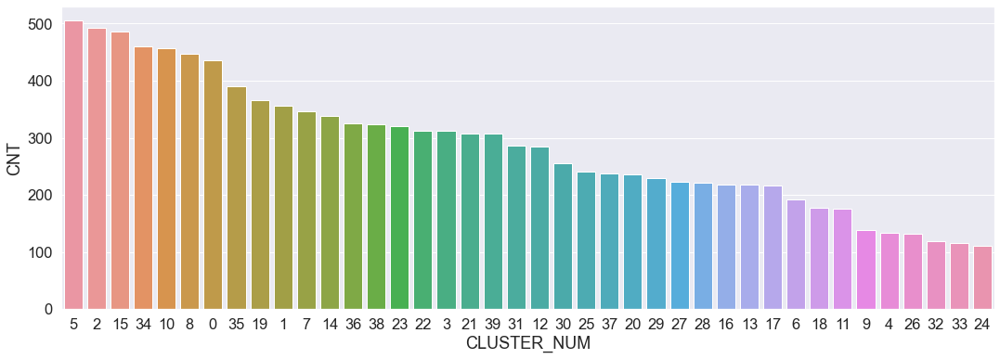

In [6]:
plt.figure(figsize=(18, 6))
sns.set_theme(font_scale=1.5,)
sns.barplot(x='CLUSTER_NUM', 
            y='CNT', 
            data=cluster_size,
            order=cluster_size['CLUSTER_NUM'].values)

## Heatmap

In [7]:
ndf = ndf.loc[ndf['SEMESTER'].apply(lambda x: x not in ['S103-1', 'S103-2', 'S104-1', 'S104-2'])]

In [8]:
plot_data = ndf.groupby(['SEMESTER', 'CLUSTER_NUM']).size().reset_index(name='CNT').pivot('SEMESTER', 'CLUSTER_NUM', 'CNT').fillna(0)
plot_data.head()

CLUSTER_NUM,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
SEMESTER,,,,,,,,,,,,,,,,,,,,,
S105-1,26.0,14.0,9.0,20.0,5.0,38.0,7.0,19.0,7.0,10.0,...,16.0,22.0,5.0,1.0,12.0,13.0,11.0,21.0,22.0,24.0
S105-2,30.0,33.0,7.0,30.0,11.0,56.0,8.0,22.0,9.0,6.0,...,20.0,31.0,10.0,4.0,30.0,11.0,31.0,9.0,22.0,28.0
S106-1,59.0,28.0,13.0,35.0,23.0,63.0,4.0,36.0,30.0,15.0,...,31.0,36.0,8.0,6.0,33.0,19.0,42.0,27.0,19.0,35.0
S106-2,37.0,26.0,11.0,28.0,8.0,44.0,6.0,24.0,22.0,4.0,...,14.0,24.0,5.0,3.0,26.0,20.0,31.0,13.0,22.0,29.0
S107-1,46.0,39.0,66.0,20.0,21.0,43.0,21.0,30.0,36.0,14.0,...,22.0,20.0,10.0,10.0,50.0,23.0,25.0,18.0,33.0,14.0


<AxesSubplot:xlabel='CLUSTER_NUM', ylabel='SEMESTER'>

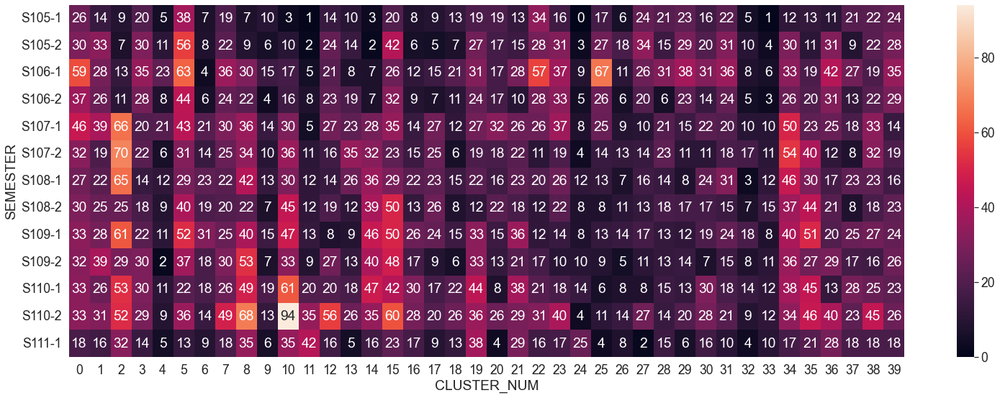

In [9]:
plt.figure(figsize=(26, 9))
sns.set(font_scale=1.6)
sns.heatmap(plot_data, annot=True,)

# WordCloud

## Segment

In [10]:
# Keywords detection
# ndf[['MESSAGE']].to_csv('MESSAGE.txt',index=False)
# jiagu.findword('MESSAGE.txt', 'KEYWORDS.txt')

In [11]:
keywords_df = pd.read_csv('./KEYWORDS.txt', header=None, sep='\t',
                       skiprows=[71, 84, 97, 190, 241, 253, 275, 276, 284, 305, 306, 320, 332, 352, 383, 393, 416, 422, 435, 461, 465, 471, 
                                 478, 481, 518, 527, 540, 541, 544, 604, 643, 655, 669, 678, 686, 723, 726, 744, 760, 774, 779 ,787, 798, 
                                 810, 811, 829, 855, 874, 878, 884, 885, 901, 903, 913, 918, 930, 932, 933, 934, 954, 988, 994, 
                                 1012, 1019, 1034, 1038, 1104, 1107, 1011, 1057, 1062, 1107, 1137, 1176, 1177, 1180, 1183, 1184, 1188, 1209, 1225, 
                                 1237, 1258, 1260, 1264, 1272, 1274, 1280, 1281, 1304, 1308, 1309, 1311, 1317, 1324, 1325, 1337, 1344, 1352, 1364, 
                                 1372, 1416, 1422, 1423, 1424, 1436, 1144, 1444, 1456, 1467, 1470, 1482, 1483, 1487, 1511, 1512, 1514, 1548, 1549, 
                                 1553, 1555, 1560, 1590, 1598, 1604, 1613, 1614, 1634, 1640, 1641, 1644, 1651, 1652, 1658, 1668, 1669, 1685, 1690, 
                                 1707, 1708, 1710, 1718, 1723, 1725, 1743, 1755, 1761, 1774, 1775, 1776, 1783, 1793, 1794, 1799, 1806, 1816, 1819, 
                                 1823, 1827, 1842, 1856, 1882, 1890, 1907, 1933, 1937, 1963, 1989, 1916, 1962, 1991, 1997, 2004, 2015, 2016, 2019, 
                                 2026, 2048, 2055, 2071, 2075, 2076, 2084, 2085, 2090, 2093, 2094, 2097, 2098, 2099, 2106, 2144, 2151, 2161, 2183, 
                                 2192, 2203, 2204, 2212, 2214, 2228, 2229, 2231, 2232, 2240, 2244, 2249, 2251, 2267, 2277, 2290, 2312, 2319, 2320, 
                                 2328, 2334, 2336, 2338, 2353, 2355, 2369, 2367, 2385, 2396, 2400, 2403, 2415, 2416, 2434, 2440, 2454, 2465, 2471, 
                                 2484, 2490, 2495, 2507, 2520, 2528, 2543, 2555, 2566, 2592, 2593, 2594, 2621, 2624, 2628, 2631, 2634]
                         )
keywords_df.columns = ['kw', 'freq']
keywords_df['kw'] = keywords_df['kw'].apply(lambda x: x.upper())
print(keywords_df.shape)
keywords_df.head()

(2399, 2)


,kw,freq
0,可以,2700
1,我們,2680
2,沒有,2264
3,同學,2036
4,大家,1956


In [12]:
jieba.initialize()

for kw, freq in zip(keywords_df['kw'], keywords_df['freq']):
    jieba.add_word(kw, freq)

for key in udf_dict:
    for kw in udf_dict[key]:
        jieba.add_word(kw)

Building prefix dict from the default dictionary ...
Dumping model to file cache C:\Users\tlyu0419\AppData\Local\Temp\jieba.cache
Loading model cost 0.568 seconds.
Prefix dict has been built successfully.


In [13]:
print(ndf.shape)

# Keep only chinese, english and numbers 
ndf['SEG_MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('[^\u4e00-\u9fa5_A-Za-z0-9]', ' ', x))
ndf['SEG_MESSAGE'] = ndf['SEG_MESSAGE'].apply(lambda x: jieba.lcut(x))

ndf['SEG_MESSAGE'] = ndf['SEG_MESSAGE'].apply(lambda x: [i for i in x if i != ' '])

# keep length more than 2
# ndf = ndf.loc[ndf['SEG_MESSAGE'].apply(lambda x: len(x)>=5)]

# reset index
ndf = ndf.reset_index(drop=True).reset_index()
ndf = ndf.rename({'index':'INDEX'}, axis=1)

print(ndf.shape)
ndf.head()

(11390, 7)
(11390, 9)


,INDEX,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS,CLUSTER_NUM,SEG_MESSAGE
0,0,黑特東華 NDHU Hate,489679074570758,2016-08-22 13:32:05,S105-1,#新投稿網址：HTTPS ===============【歡慶重新開張】==========...,"[0.012359037, 0.03448369, 0.027585927, -0.0453...",20,"[新, 投稿, 網址, HTTPS, 歡慶, 重新, 開張, 嗨, 各位, 東華, 的, 同..."
1,1,黑特東華 NDHU Hate,489905007881498,2016-08-23 01:21:32,S105-1,哈囉~ 大家好~~ 各位有玩POKEMON GO的東華玩家快點照過來吧~~ 快來加入我們的社...,"[-0.007877224, 0.004218488, 0.0059408853, -0.0...",38,"[哈囉, 大家好, 各位, 有, 玩, PO, KEM, ON, GO, 的, 東華, 玩家..."
2,2,黑特東華 NDHU Hate,490171744521491,2016-08-23 17:18:18,S105-1,咦～教育與潛能開發學系應該要簡稱為「教潛系」吧！！！！！ 教育系應該是教行系跟「教潛系」兩者...,"[0.017824875, -0.02140165, -0.026543079, -0.02...",12,"[咦, 教育與潛能開發學系, 應該, 要, 簡, 稱為, 教潛系, 吧, 教育系, 應該, ..."
3,3,黑特東華 NDHU Hate,490970554441610,2016-08-25 17:11:10,S105-1,[非黑特] 上一篇好像被系統吃文了 ( 想請問現在學校裡的超商有開嗎?因為有事先回學校短期住...,"[-0.009055654, 0.0077310097, -0.023193244, -0....",19,"[非黑特, 上一篇, 好像, 被, 系統, 吃文, 了, 想請問, 現在, 學校, 裡的, ..."
4,4,黑特東華 NDHU Hate,490970594441606,2016-08-25 17:11:13,S105-1,哈囉~ 大家好!! 經過漫長的暑假 有沒有感覺電腦稍稍變慢了啊!? 還是打算升級一下自己的電...,"[0.024557965, -0.0012700085, 0.012720575, -0.0...",20,"[哈囉, 大家好, 經過, 漫長, 的, 暑假, 有沒有, 感覺, 電腦, 稍稍, 變慢, ..."


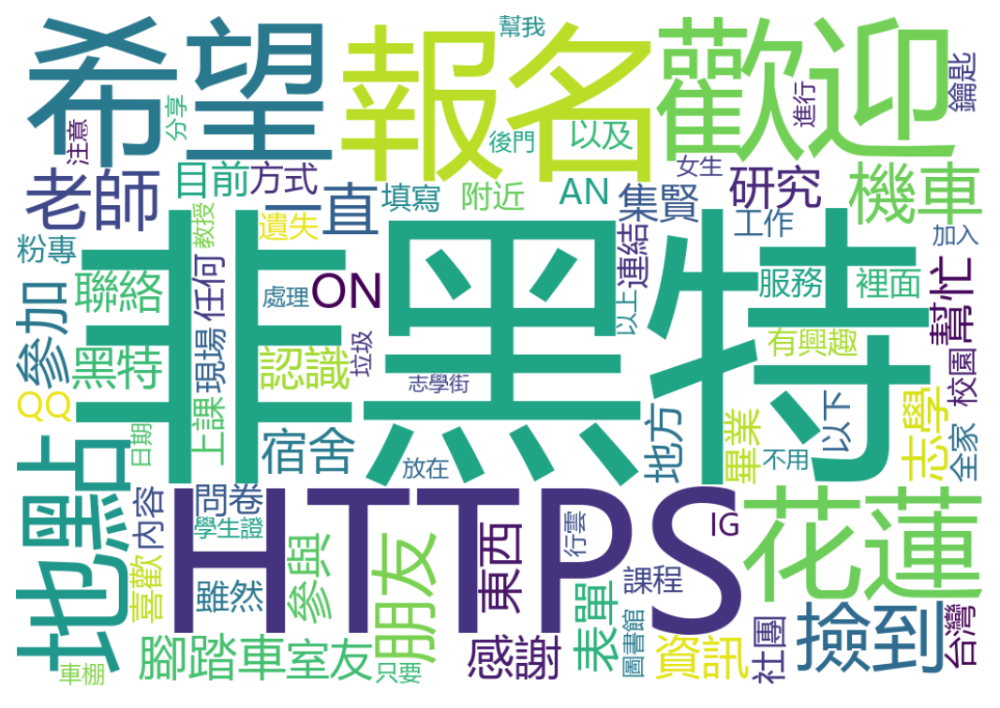

In [14]:
# 不分類的文字雲
wc_dict = ndf['SEG_MESSAGE'].explode('SEG_MESSAGE').value_counts().reset_index()
wc_dict = wc_dict.loc[wc_dict['index'].apply(lambda x: len(x)>=2)]
wc_dict = wc_dict.loc[wc_dict['index'].apply(lambda x: x not in stop_words)]
wc_dict = wc_dict.set_index('index').to_dict()['SEG_MESSAGE']
plot_wordcloud(wc_dict)

## TFIDF

In [15]:
# ndf['SEG_MESSAGE'] = ndf['SEG_MESSAGE'].apply(lambda x:[kw+'_' for kw in x])
# stop_words = [kw+'_' for kw in stop_words]
# stop_words[:10]

In [16]:
ndf['SEG_MESSAGE'] = ndf['SEG_MESSAGE'].apply(lambda x: ' '.join(x))
ndf2 = ndf.groupby('CLUSTER_NUM')['SEG_MESSAGE'].apply(lambda x: ' '.join(x)).reset_index()
vectorizer = TfidfVectorizer(min_df=10, stop_words=stop_words, max_features=5000)
X = vectorizer.fit_transform(ndf2['SEG_MESSAGE'])
X.shape

C:\Users\tlyu0419\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\feature_extraction\text.py:404: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['in', 'le'] not in stop_words.
  warnings.warn(


(40, 2805)

In [17]:
tfidf_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out()).stack().reset_index()
tfidf_df.columns = ['CLUSTER_NUM', 'TFIDF_KWS', 'VALUE']
tfidf_df = tfidf_df.loc[tfidf_df['VALUE']!=0]
tfidf_df = tfidf_df.sort_values(['CLUSTER_NUM', 'VALUE'], ascending=[True, False])
tfidf_df = tfidf_df.groupby('CLUSTER_NUM').head(100)
tfidf_df

,CLUSTER_NUM,TFIDF_KWS,VALUE
2723,0,非黑特,0.379790
2240,0,花蓮,0.223997
1028,0,宿舍,0.152055
529,0,八卦,0.139381
103,0,qq,0.129836
...,...,...,...
111720,39,解釋,0.046633
112062,39,關於,0.046633
110155,39,問問,0.046387
110437,39,實驗,0.046387


## Plot

In [18]:
# 19, >> 校內違規騎車
# 30, 37 >> 交通
# 16, 21>> 停車
# 3, 9 >> 宿舍
# 22, 28 >> 吵
# 26 >> 寵物攻擊
# 27, 29 >> 感情

(1383, 9)


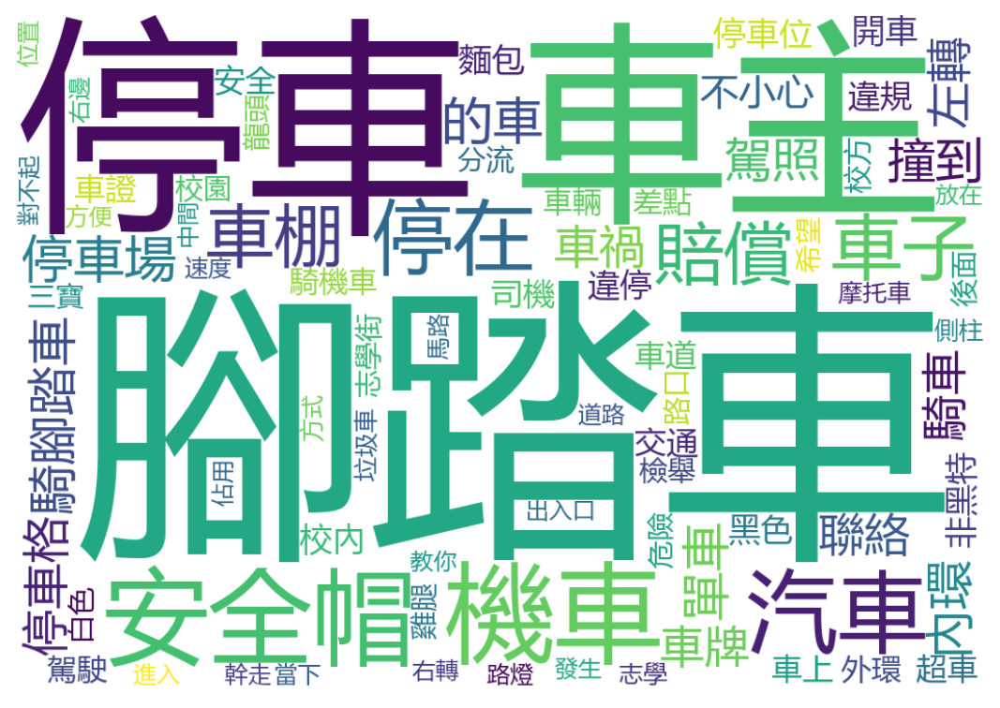

In [19]:
print(ndf.loc[ndf['CLUSTER_NUM'].apply(lambda x: x in [19, 30, 37, 16, 21])].shape)
plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [19, 30, 37, 16, 21])]
word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
plot_wordcloud(word_dict)

(983, 9)


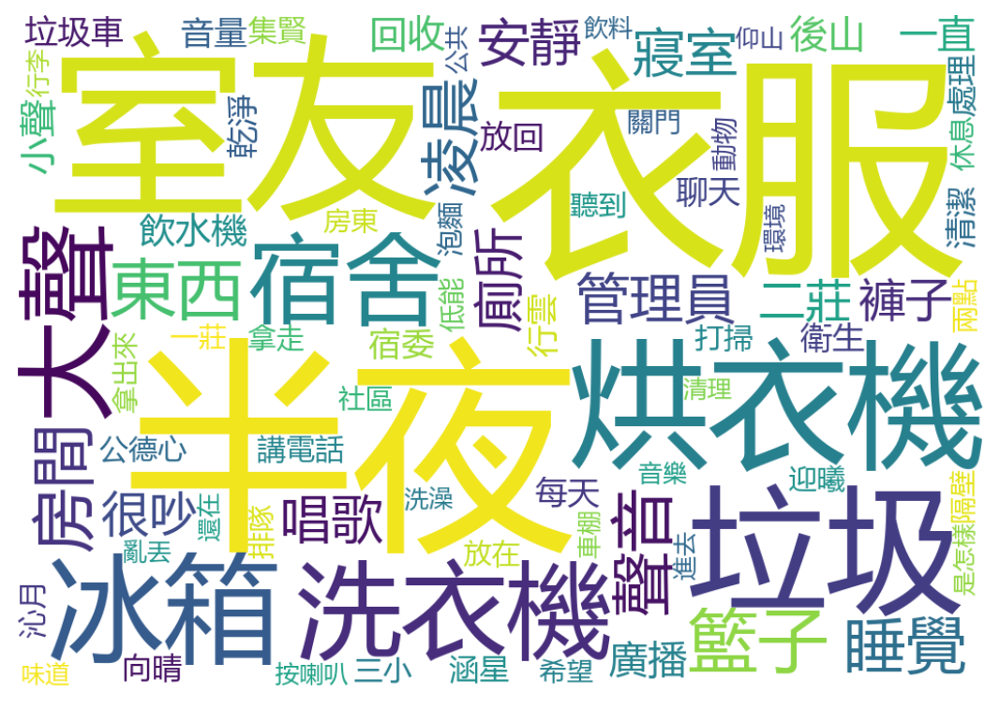

In [20]:
print(ndf.loc[ndf['CLUSTER_NUM'].apply(lambda x: x in [3, 9, 22, 28])].shape)
plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [3, 9, 22, 28])]
word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
plot_wordcloud(word_dict)

(451, 9)


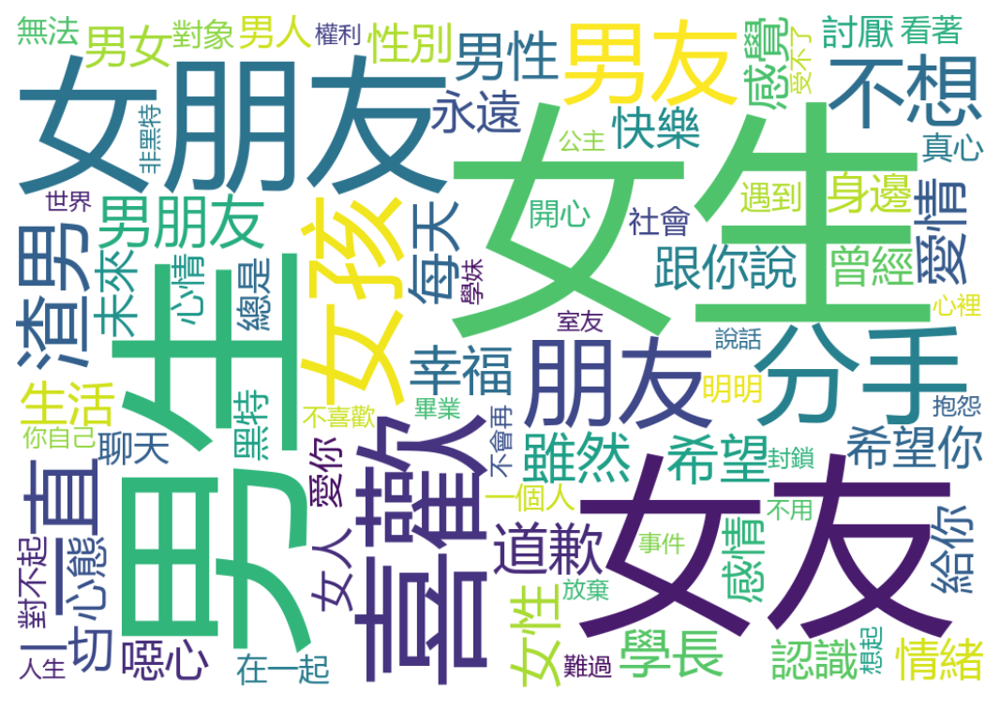

In [21]:
print(ndf.loc[ndf['CLUSTER_NUM'].apply(lambda x: x in [27, 29])].shape)
plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [27, 29])]
word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
plot_wordcloud(word_dict)

# Overview - SubPlot

0 0
0 1
0 2
0 3
0 4
1 0
1 1
1 2
1 3
1 4
2 0
2 1
2 2
2 3
2 4
3 0
3 1
3 2
3 3
3 4
4 0
4 1
4 2
4 3
4 4
5 0
5 1
5 2
5 3
5 4
6 0
6 1
6 2
6 3
6 4
7 0
7 1
7 2
7 3
7 4


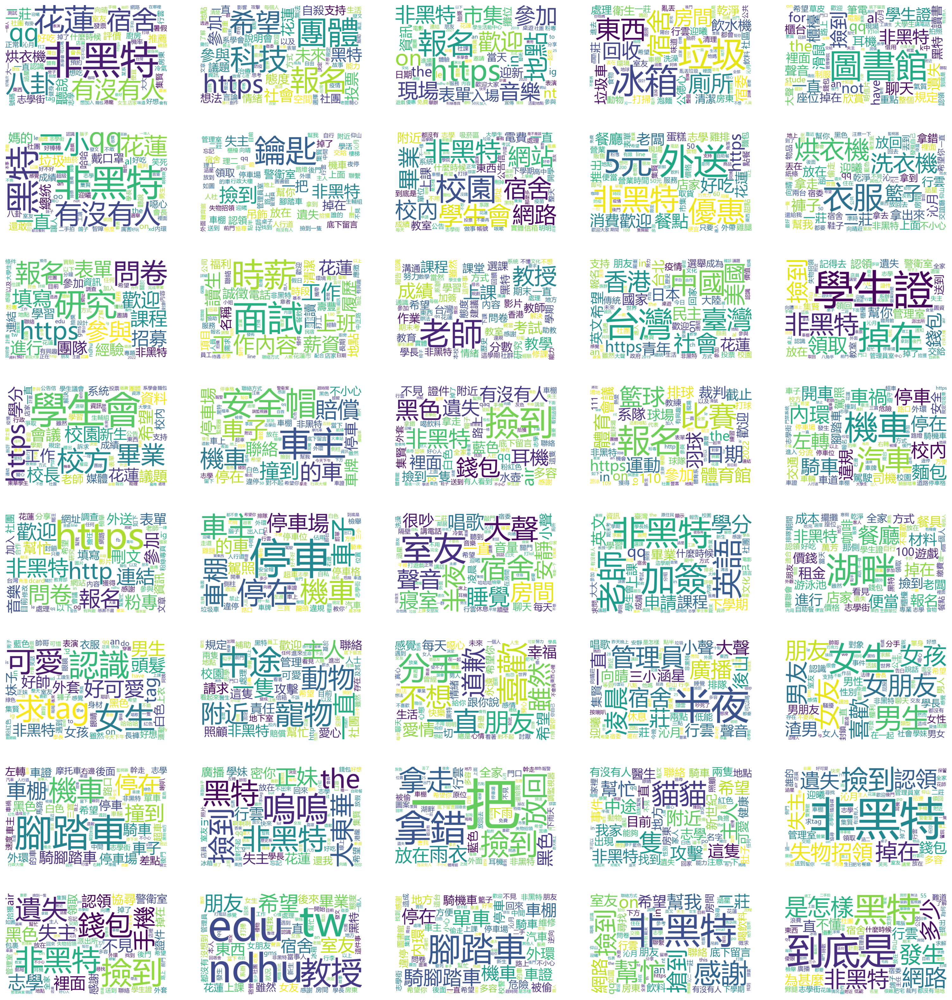

In [22]:
num_rows = 8
num_cols = 5
clu_wc = 0

fig, ax = plt.subplots(num_rows, num_cols, figsize=(24, 26), dpi=160)
for nr in list(range(num_rows)):
    for nc in list(range(num_cols)):
        plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [clu_wc])]
        word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
        wordcloud =  WordCloud(font_path='C:/Windows/Fonts/Microsoft YaHei/msyh.ttc',
                               width=800,
                               height=500,
                               max_words=80,
                               min_font_size=3,
                               background_color="white").generate_from_frequencies(word_dict)
        ax[nr][nc].axis("off")
        ax[nr][nc].imshow(wordcloud, interpolation="bilinear")
        print(nr, nc)
        clu_wc +=1
plt.show()

# Process
- 文本長什麼樣子
- 怎麼建立關聯>> 文本中共同提到什麼詞
- 理想上應該要看到什麼，例如湖畔會看到各個東西
- 要這樣做會有哪些流程
- 每個流程遇到的問題
    - 怎麼斷詞
    - 怎麼篩選出需要關注的關鍵詞
    - 資料科學家會跑出結果，但解釋還是需要商業分析師

In [34]:
# 交通: Cluster Num: 19
# ndf.loc[ndf['CLUSTER_NUM']==21, ['POSTID','MESSAGE']].values

In [39]:
# 宿舍環境: Cluster Num: 3, 9, 22, 28
# ndf.loc[ndf['CLUSTER_NUM']==28, ['POSTID','MESSAGE']].values

In [42]:
# 感情: Cluster Num: 27, 29
ndf.loc[ndf['CLUSTER_NUM']==27, ['POSTID','MESSAGE']].values

array([['503684463170219',
        '對,沒錯我現在是一點都不想跟你講電話沒錯 但是我現在不跟你講電話 我哪時候可以跟你講電話 你就是這麼忙 就是沒空 我就是不想跟你說晚安 就是不想說 說了晚安掛了電話 下次呢 再等十年嗎'],
       ['505759302962735',
        'O宇O 你死不認帳 甚至恬不知恥留言回文 說是刻意抹黑 你有一點點良心嗎? 你自恃有著夏夕夏景的嫡系郭某庇護 得以在鴨頭旁巷內三合院休養生息 那個傻女人卻幾乎獨自一人面對 來自四面八方的質疑 身為她的閨密 勸說不了她放棄 只好也下海一博 或許這麼做 在家大業大幸運的天龍精子你面前 無疑渺小 不削一顧 甚至顯得可笑 對不到一年就會畢業的你來說 我們所做的事無疑螳臂擋車 但是我們仍會持續戰鬥下去 雖長路漫漫 但長夜終盡'],
       ['508359492702716',
        '君の名は要上映惹 肥宅我好想約學姊去看喔 可是我是超肥宅，感覺一定會被發卡 好煩惱喔，種摸半'],
       ['512971382241527',
        '應數O-簡XX 自己也還想不透 是從什麼時候 鐘聲響起後 想為你停留 每個動態都追蹤 我不想再錯過 任何能逗你 開心的線索 回想每個有你的片段 有些話逐漸變得明白 這次不放手 不囉嗦 在一起好嗎 看你和別人談笑 才突然間明瞭 我想要獨佔 你的每一秒'],
       ['524437614428237',
        '真的很想裝桶滾水往你的臉上倒,看看能不能燙掉你的無恥厚顏,難道非得搞到翻臉你才會了解別人有多不喜歡自己的私人空間被侵犯嗎？'],
       ['525958950942770',
        '今天阿CO比較少出來嗆人，真是藍瘦香菇好無聊，超喜歡看他自己打自己臉的，每次他說『有種約出來，你多有本事？』，可是別人真的要約他又說『你哪位，有資格約我？』，啪啪啪啪啪，一直打一直打，阿CO你臉會不會痛痛，不知道我有沒有資格幫你呼呼？'],
       ['528534907351841', '可以不要都只唱同一首歌嗎 而且每天都唱很多次 很膩 你讓我討厭那首歌了'],
       ['528535257351806',
        '在你面前裝氣質好

In [ ]:
# 大事件: 選課、訂票、校長貪污、陸客、修課、停車
# 體育系 > 學長學弟制
# 群中心和群的代表關鍵詞

In [ ]:
# 活動: 1.你覺得透過模型分群效果好或不好
#       2. 事情有多嚴重(數量有多少)
#      3. 這群貼文在講什麼事情，為什麼會有這個抱怨?
#      4. 根據你的觀察，你會建議可以怎麼處理?(社會關懷)
# 你看了幾群， 這些群的貼文在抱怨什麼， 有沒有可以改進的地方?

# 報告架構
- 說明目的，這麼多抱怨，到底在抱怨哪些事情，數量有多少
- 怎麼做資料的爬蟲
- 怎麼對文本做分群 >> 斷詞(統計、人工) >> 轉向量，向量跟分群的關係是什麼? (那身高體重為例，可以分群，而實際上的維度會有512維)
- 怎麼選分群的數量
- 有了分群之後我們就可以搭配時間，看到許多不同的事件，有些是早期，有些是後期，有些是長期，我們可以忽略掉數量太少的群(稀少數量的抱怨可能是個案)
- 群的代表貼文、數量、意義、文字雲跟想法
- 討論活動
- 細節，如何做這次的分析